## 1. Data Overview

In [1]:
#importing the libraries

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates 
from sklearn.utils import resample
from scipy.ndimage import gaussian_filter
import seaborn as sns
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from matplotlib.dates import DateFormatter
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression

In [3]:

# Printing the number of rows and columns in the initial dataframe
num_rows, num_columns= init_df.shape

print (f'Number of rows: {num_rows}')
print (f'Number of columns: {num_columns}')

Number of rows: 24386900
Number of columns: 15


In [4]:
import warnings

# Suppressing the FutureWarning for the 'str.replace' method
warnings.filterwarnings("ignore", category=FutureWarning)

# Preprocessing the data
df = init_df.copy()

# Cleaning the dataset to make sure that the amount has no $ sign
df['Amount'] = df['Amount'].replace('[\$,]', '', regex=True).astype(float)

# Mapping 'Is Fraud?' column to numeric values
df['Is Fraud?'] = df['Is Fraud?'].map({'Yes': 1, 'No': 0})


# Converting 'Time' column to a proper timestamp
df['Timestamp'] = pd.to_datetime(df['Year'].astype(str) + '-' + df['Month'].astype(str) + '-' +
                                df['Day'].astype(str) + ' ' + df['Time'])


# Removing ':' from time and converting to integer
df['Time'] = df['Time'].str.replace(':', '')
df['Time'] = df['Time'].astype('int')

# Sorting by timestamp as precaution
df = df.sort_values(by='Timestamp')


df['Day_of_Week'] = df['Timestamp'].dt.day_name()
df['Hour_of_Day'] = df['Timestamp'].dt.hour

# Displaying the preprocessed dataset
print("\nPreprocessed Dataset:")
print(df.head(10))



Preprocessed Dataset:
         User  Card  Year  Month  Day  Time  Amount           Use Chip  \
9196264   791     1  1991      1    2   710   68.00  Swipe Transaction   
9196265   791     1  1991      1    2   717  -68.00  Swipe Transaction   
9196266   791     1  1991      1    2   721  113.62  Swipe Transaction   
9196267   791     1  1991      1    2  1730  114.73  Swipe Transaction   
9196268   791     1  1991      1    3   903  251.71  Swipe Transaction   
9196269   791     1  1991      1    3  1114   16.28  Swipe Transaction   
9196270   791     1  1991      1    3  1246  172.00  Swipe Transaction   
9196271   791     1  1991      1    4  1109   16.63  Swipe Transaction   
9196272   791     1  1991      1    4  1356   27.00  Swipe Transaction   
9196273   791     1  1991      1    5   840  210.64  Swipe Transaction   

               Merchant Name Merchant City Merchant State      Zip   MCC  \
9196264  2027553650310142703         Burke             VA  22015.0  5541   
9196265  2

In [5]:
# Printing the number of rows and columns in the initial dataframe
num_rows, num_columns= df.shape

print (f'Number of rows: {num_rows}')
print (f'Number of columns: {num_columns}')

Number of rows: 24386900
Number of columns: 18


In [6]:
# Information df

print("Data Name: ", "df") 
print("\nColumn Information:")
print(df.info())


Data Name:  df

Column Information:
<class 'pandas.core.frame.DataFrame'>
Index: 24386900 entries, 9196264 to 5243747
Data columns (total 18 columns):
 #   Column          Dtype         
---  ------          -----         
 0   User            int64         
 1   Card            int64         
 2   Year            int64         
 3   Month           int64         
 4   Day             int64         
 5   Time            int64         
 6   Amount          float64       
 7   Use Chip        object        
 8   Merchant Name   int64         
 9   Merchant City   object        
 10  Merchant State  object        
 11  Zip             float64       
 12  MCC             int64         
 13  Errors?         object        
 14  Is Fraud?       int64         
 15  Timestamp       datetime64[ns]
 16  Day_of_Week     object        
 17  Hour_of_Day     int32         
dtypes: datetime64[ns](1), float64(2), int32(1), int64(9), object(5)
memory usage: 3.4+ GB
None


In [7]:
# Check for null values in df
null_values = df.isnull().sum()

# Display columns with null values and their counts
columns_with_null = null_values[null_values > 0]
print("Columns with Null Values:")
print(columns_with_null)


Columns with Null Values:
Merchant State     2720821
Zip                2878135
Errors?           23998469
dtype: int64


In [8]:
# Checking the number of fraudulent transactions
df['Is Fraud?'].value_counts()

Is Fraud?
0    24357143
1       29757
Name: count, dtype: int64

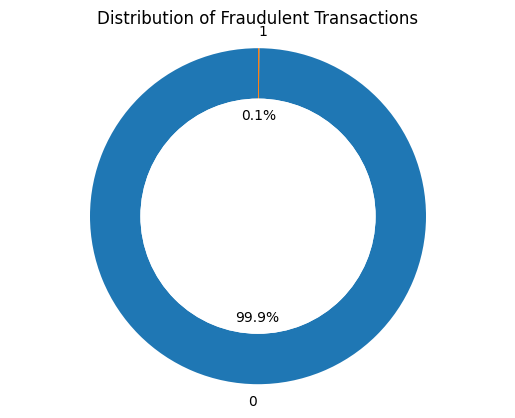

In [9]:

fraud_counts = df['Is Fraud?'].value_counts()

# Plotting a donut chart
fig, ax = plt.subplots()

# Creating a pie chart with a white circle in the center to make it a donut chart
ax.pie(fraud_counts, labels=fraud_counts.index, autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.3))

# Draw a white circle at the center to make it a donut chart
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle
ax.axis('equal')

plt.title('Distribution of Fraudulent Transactions')
plt.show()


## 2. Exploratory data analysis

In [4]:
fraud_df= df[df['Is Fraud?']==1]

In [11]:

print("Data Name: ", "fraud_df")  
print("\nColumn Information:")
print(fraud_df.info())


Data Name:  fraud_df

Column Information:
<class 'pandas.core.frame.DataFrame'>
Index: 29757 entries, 15091316 to 5557908
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   User            29757 non-null  int64         
 1   Card            29757 non-null  int64         
 2   Year            29757 non-null  int64         
 3   Month           29757 non-null  int64         
 4   Day             29757 non-null  int64         
 5   Time            29757 non-null  int64         
 6   Amount          29757 non-null  float64       
 7   Use Chip        29757 non-null  object        
 8   Merchant Name   29757 non-null  int64         
 9   Merchant City   29757 non-null  object        
 10  Merchant State  11408 non-null  object        
 11  Zip             4905 non-null   float64       
 12  MCC             29757 non-null  int64         
 13  Errors?         1286 non-null   object        
 14  Is Fraud

In [13]:
# Assuming fraud_df is your DataFrame containing fraud entries
fraud_statistics = fraud_df.describe(include='all')
print(fraud_statistics)


                User          Card          Year        Month           Day  \
count   29757.000000  29757.000000  29757.000000  29757.00000  29757.000000   
unique           NaN           NaN           NaN          NaN           NaN   
top              NaN           NaN           NaN          NaN           NaN   
freq             NaN           NaN           NaN          NaN           NaN   
mean     1011.044292      1.623282   2011.963538      6.64237     15.785395   
min         0.000000      0.000000   1996.000000      1.00000      1.000000   
25%       545.000000      0.000000   2008.000000      4.00000      8.000000   
50%      1020.000000      1.000000   2012.000000      7.00000     16.000000   
75%      1487.000000      3.000000   2016.000000     10.00000     24.000000   
max      1997.000000      8.000000   2019.000000     12.00000     31.000000   
std       559.300281      1.522769      4.641755      3.47439      8.885974   

                Time        Amount            Use C

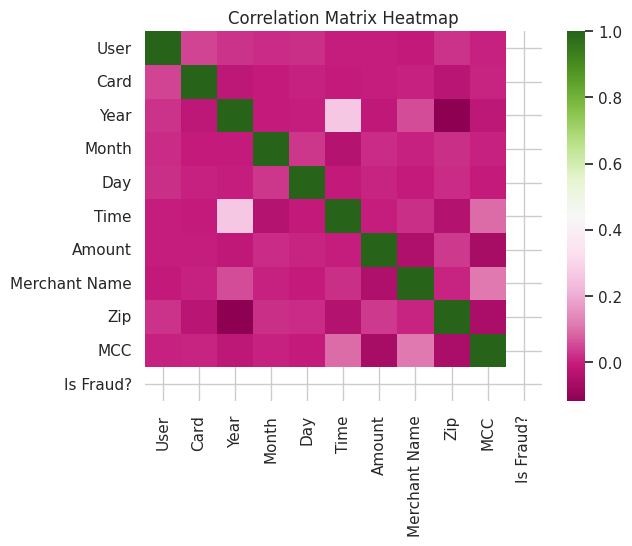

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for Seaborn plots
sns.set(style="whitegrid")

# Select only numeric columns for correlation matrix
numeric_columns = fraud_df.select_dtypes(include=['int64', 'float64']).columns
correlation_matrix = fraud_df[numeric_columns].corr()

# Heatmap without numeric values
sns.heatmap(correlation_matrix, annot=False, cmap='PiYG', fmt=".2f", cbar=True)
plt.title('Correlation Matrix Heatmap')
plt.show()




### 2.1 Distribution of Fraudulent Transactions by Amount

/tmp/ipykernel_169816/4152064636.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(fraud_df['Amount'].astype(float), kde=False, bins=80, color='darkblue')


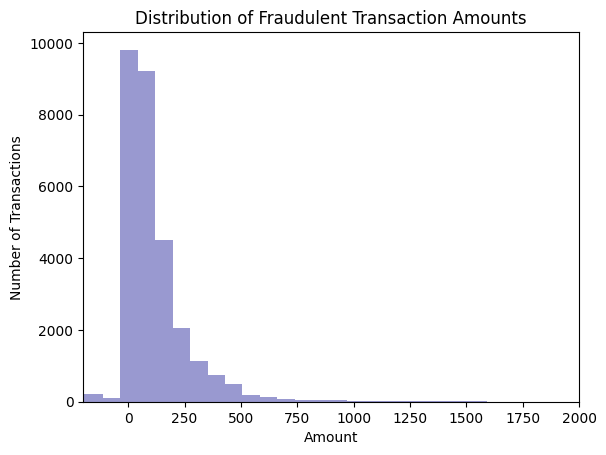

In [9]:
#Creating a histogram plot for the distribution of transaction amount

sns.distplot(fraud_df['Amount'].astype(float), kde=False, bins=80, color='darkblue')
plt.title('Distribution of Fraudulent Transaction Amounts')
plt.xlabel('Amount')
plt.ylabel('Number of Transactions')
plt.xlim(-200, 2000)



plt.show()

As we can see, the majority of the transactions lie between 0 to 250 which indicates that frauds are more prevalent in smaller value transactions

### 2.2 Distribution of Fraudulent Transactions worldwide

/tmp/ipykernel_169816/2356980338.py:12: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.countplot(data=fraud_df, y='Merchant State', order=state_counts.index, palette=cmap(range(len(state_counts))))


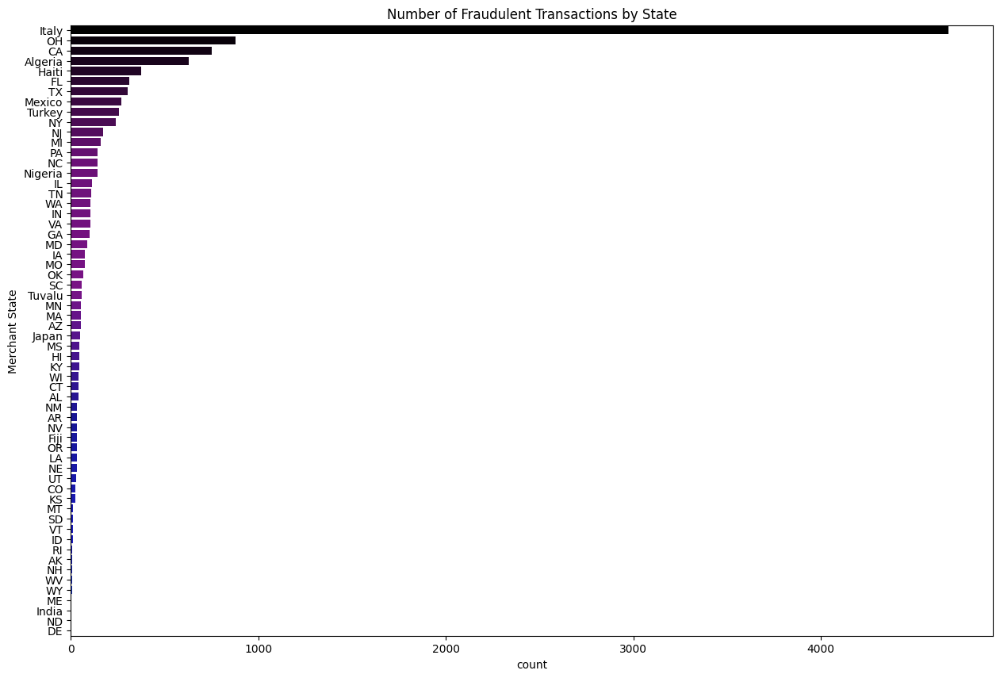

In [10]:
#Creating a bar  chart to see the geographical distribution of the credit card frauds

plt.figure(figsize=(15, 10))

# Getting the count of fraudulent transactions by state
state_counts = fraud_df['Merchant State'].value_counts()

# Using a custom color map for the count plot
cmap = plt.get_cmap('nipy_spectral') 

# Plotting the count plot
sns.countplot(data=fraud_df, y='Merchant State', order=state_counts.index, palette=cmap(range(len(state_counts))))

plt.title('Number of Fraudulent Transactions by State')
plt.show()


The data consists of a mix of US states and countries, highlighting clear geographical distinstions. 

Top 5 countries with most fraudulent transactions: Italy, Haiti, Algeria, Mexico and Turkey.

Top 5 US states with most fraudualent transactions: Ohio, California, Florida, Texas and New York

### 2.3 Top 20 cities with Fraudulent Transactions

In [11]:
fraud_df.columns

Index(['User', 'Card', 'Year', 'Month', 'Day', 'Time', 'Amount', 'Use Chip',
       'Merchant Name', 'Merchant City', 'Merchant State', 'Zip', 'MCC',
       'Errors?', 'Is Fraud?', 'Timestamp', 'Day_of_Week', 'Hour_of_Day'],
      dtype='object')

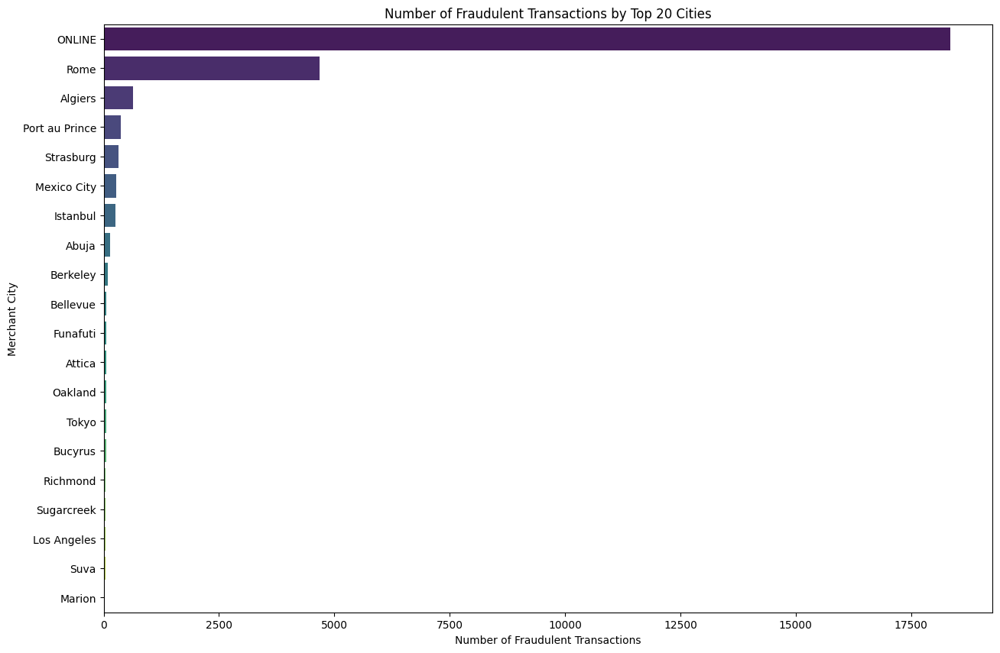

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Creating a bar chart for the top 20 cities with fraudulent transactions

plt.figure(figsize=(15, 10))

# Getting the count of fraudulent transactions by city for the top 20 cities
top_cities = fraud_df['Merchant City'].value_counts().head(20)

# Using a horizontal bar plot to display counts on the x-axis
sns.barplot(x=top_cities, y=top_cities.index, palette='viridis')

# Adding labels and title
plt.xlabel('Number of Fraudulent Transactions')
plt.ylabel('Merchant City')
plt.title('Number of Fraudulent Transactions by Top 20 Cities')

plt.show()


## 3. Time variation using different parameters.



As we can see, online transactions have the highest occurence which suggests technological adoption and economic activity. Tourist destinations like Rome, Algiers, Port au Prince, Stratsburg, and Mexico City may experience more fraud due to increased transaction volumes. 

### 3.1 Frauds per year

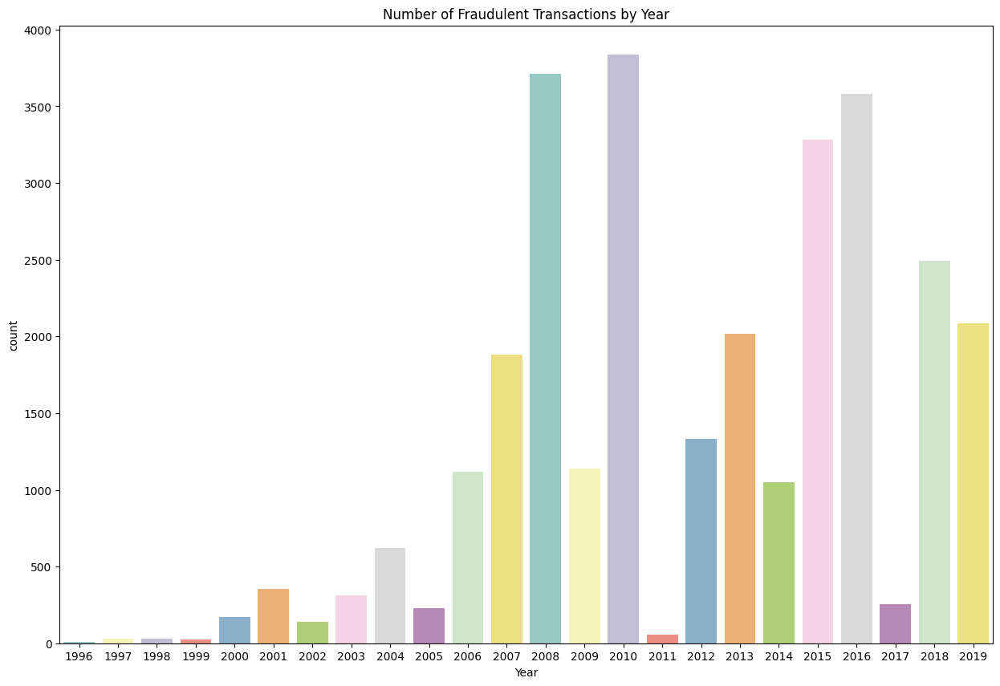

In [13]:
#  By year

plt.figure(figsize=(15, 10))
sns.countplot(data=fraud_df, x='Year')
plt.title('Number of Fraudulent Transactions by Year')

 # Using a different color scheme (Set2) for the count plot
sns.countplot(data=fraud_df, x='Year', palette='Set3')

plt.show()

The analysis of fraudulent transactions spanning from 1996 to 2019 illustrates a consistent upward trend entering the 21st century. The number of fraud cases steadily rose year by year, reaching its pinnacle in 2007-2008 during the Great Recession. Following this peak, there was a subsequent decline, but a resurgence occurred in 2016, indicating potential shifts in criminal tactics or responses to changing economic.

### 3.2 Frauds per month

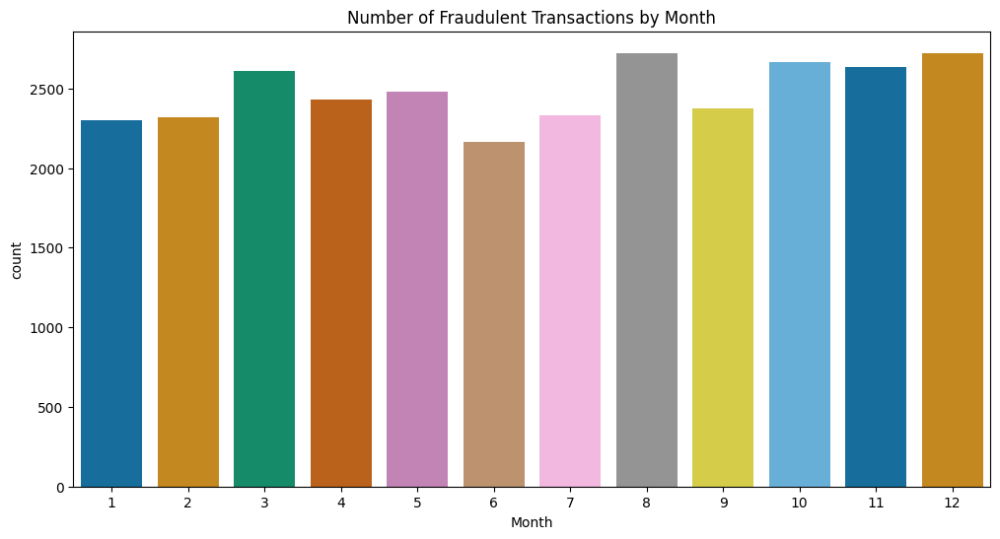

In [14]:
# By month

plt.figure(figsize=(12, 6))
sns.countplot(data=fraud_df, x='Month')
plt.title('Number of Fraudulent Transactions by Month')

# Using a different color scheme (Set2) for the count plot
sns.countplot(data=fraud_df, x='Month', palette='colorblind')
plt.show()

The distribution of fraudulent cases throughout the months exhibits minimal variations, yet a slight increase in fraudulent activities is noticeable as the year concludes. This uptick toward the year's end may be attributed to various factors such as increased holiday shopping, heightened financial transactions during the festive season, or potential exploitation of year-end financial reporting periods.

### 3.3 Frauds per day of the week

/tmp/ipykernel_169816/3583340269.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fraud_df['Day_of_Week'] = fraud_df['Timestamp'].dt.day_name()


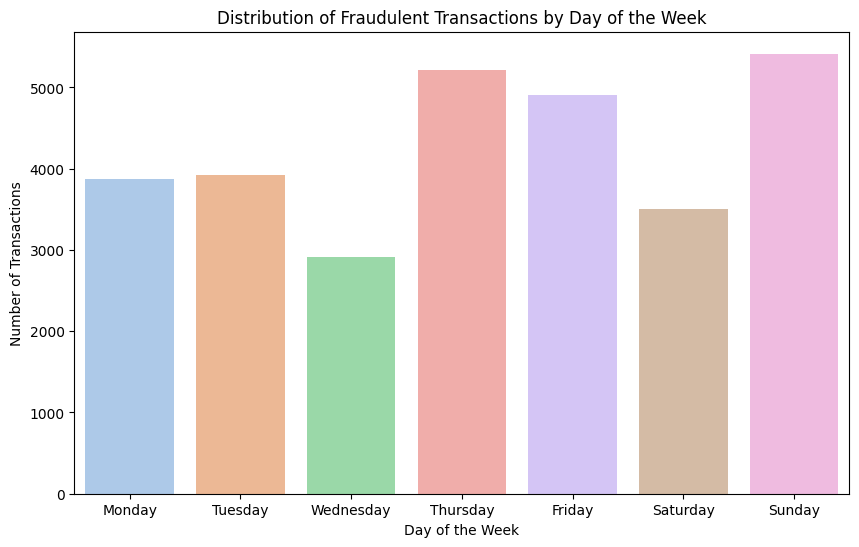

In [15]:
# By day of the week

# Extracting the day of the week and create a new column
fraud_df['Day_of_Week'] = fraud_df['Timestamp'].dt.day_name()

# Countplotting for the distribution of fraud cases across days of the week
plt.figure(figsize=(10, 6))

# Using a different color scheme (Set3) for the count plot and make bars smaller
sns.countplot(data=fraud_df, x='Day_of_Week', order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], palette='pastel', saturation=0.7)

plt.title('Distribution of Fraudulent Transactions by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Transactions')
plt.show()


Wednesdays exhibit the lowest count of fraudulent transactions, while Sundays show the highest.

### 3.4 Frauds per hour of the day

/tmp/ipykernel_169816/2904240313.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fraud_df['Timestamp'] = pd.to_datetime(fraud_df['Timestamp'])
/tmp/ipykernel_169816/2904240313.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fraud_df['Hour_of_Day'] = fraud_df['Timestamp'].dt.hour


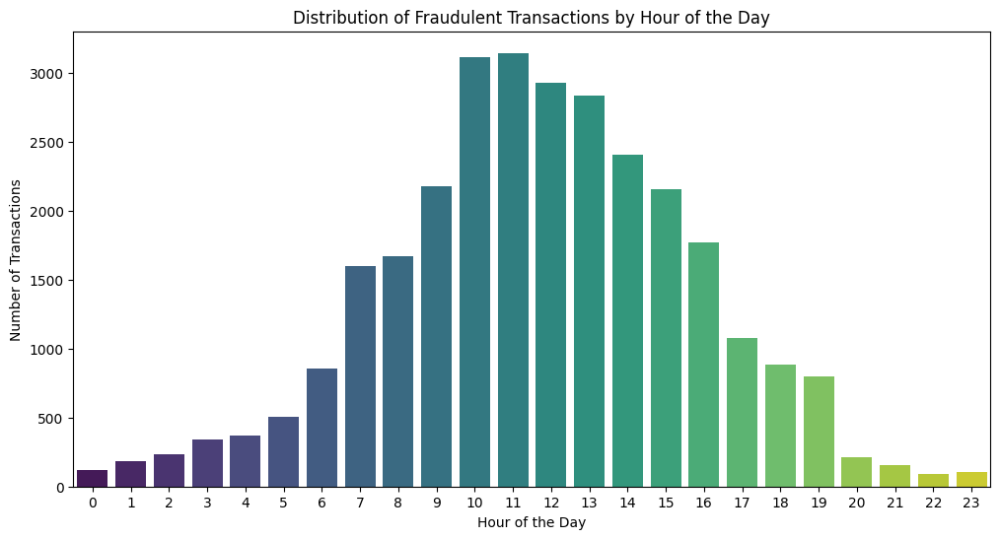

In [16]:
# By hour of the day

fraud_df['Timestamp'] = pd.to_datetime(fraud_df['Timestamp'])  

# Extracting the hour of the day and create a new column
fraud_df['Hour_of_Day'] = fraud_df['Timestamp'].dt.hour

# Countplotting for the distribution of fraud cases across hours of the day
plt.figure(figsize=(12, 6))
sns.countplot(data=fraud_df, x='Hour_of_Day', palette='viridis')

plt.title('Distribution of Fraudulent Transactions by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Transactions')
plt.show()

As shown in the chart, we can notice most of the fraudulent transactions happening between 10am - 12pm. The surge in fraudulent transactions between 10 am and 12 pm likely reflects fraudsters exploiting the higher transaction volume during peak business hours. Users may be more distracted or engaged in numerous transactions during this time, providing an opportune window for fraudulent activities to go unnoticed.

### 3.5 Frauds per minutes past midnight

/tmp/ipykernel_169816/1581322409.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fraud_df['RoundedMinutesPastMidnight'] = fraud_df['Timestamp'].apply(round_down_to_half_hour_as_integer)


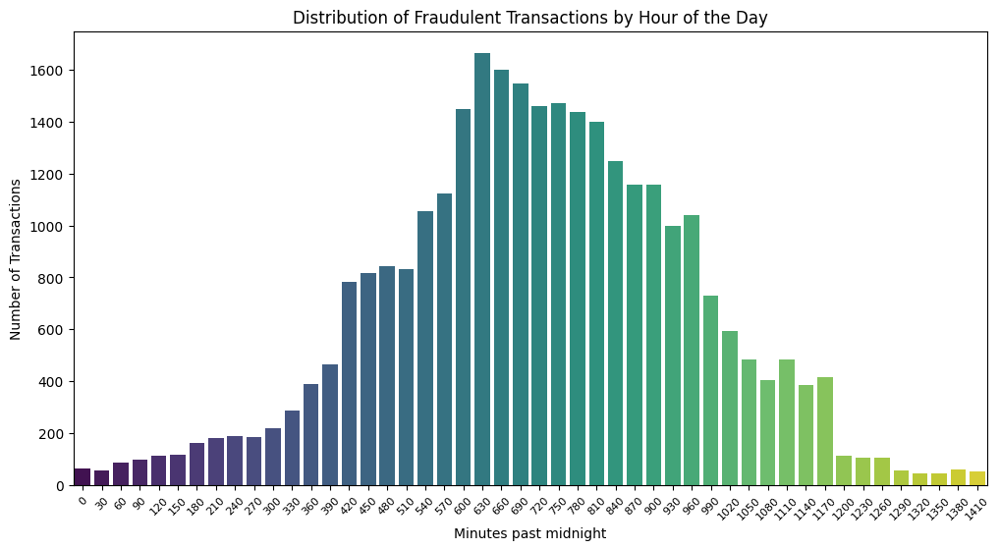

In [17]:
# By minutes past midnight

#Creating a new timestamp
def round_down_to_half_hour_as_integer(timestamp):
    rounded_timestamp = timestamp - pd.to_timedelta(timestamp.minute % 30, unit='m')
    minutes_since_midnight = (rounded_timestamp - pd.to_datetime(rounded_timestamp.date())).total_seconds() // 60
    return int(minutes_since_midnight)


# Applying the function to create the new integer column
fraud_df['RoundedMinutesPastMidnight'] = fraud_df['Timestamp'].apply(round_down_to_half_hour_as_integer)
fraud_df['RoundedMinutesPastMidnight']

# Countplotting for the distribution of fraud cases across hours of the day
plt.figure(figsize=(12, 6))
sns.countplot(data=fraud_df, x='RoundedMinutesPastMidnight', palette='viridis')

plt.title('Distribution of Fraudulent Transactions by Hour of the Day')
plt.xlabel('Minutes past midnight')
plt.ylabel('Number of Transactions')

# Adjusting x-axis labels for better readability
plt.xticks(rotation=45, fontsize=8)
           
plt.show()

Investigating the distribution of fraudulent transactions by minutes past midnight reveals noteworthy patterns. The countplot illustrates varying levels of fraudulent activities throughout different intervals, with a distinctive peak observed at certain minutes past midnight (630 - 690).

## 4. Transaction Method

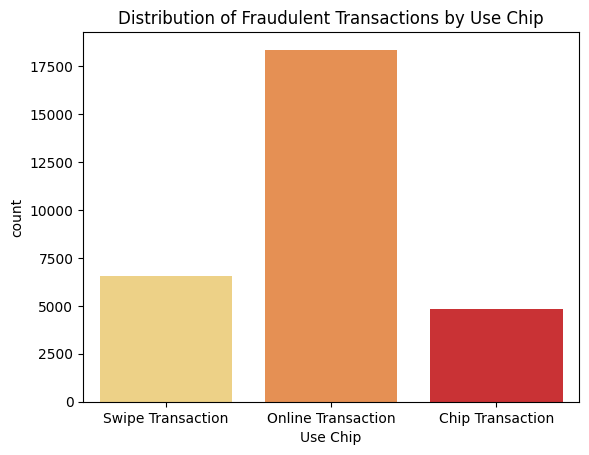

In [18]:

# Countplotting for the distribution of fradulent transactions by Use chip

sns.countplot(data=fraud_df, x='Use Chip', palette= 'YlOrRd')
plt.title('Distribution of Fraudulent Transactions by Use Chip')
plt.show()

## 5. Fraud Detection with Machine Learning

### 5.1 Data Preprocessing

From the exploratory data analysis conducted, our focus will be directed towards variables that seem to have a more pronounced influence on identifying fraudulent transactions. After excluding variables with a considerable percentage of missing values, the selected variables for modeling are as follows.








In [14]:
# Binary encoding for categorical variables
import pandas as pd


def categorical_to_numerical(unique_category_series, string_series):
    """
    Encode strings in a Series as numerical values based on the index of a unique category Series.

    Parameters:
    - string_series: Pandas Series of strings to be encoded.
    - unique_category_series: Pandas Series with unique categories, used for encoding.

    Returns:
    - Pandas Series with numerical encoding.
    """

    # Create a dictionary mapping categories to numerical values based on their index
    category_mapping = {category: index for index, category in enumerate(unique_category_series)}

    # Use the map function to replace strings with numerical values
    encoded_series = string_series.map(category_mapping)

    return encoded_series

def decode_numbers_as_strings(number_series, unique_category_series):
    """
    Decode numerical values in a Series to strings based on the index of a unique category Series.

    Parameters:
    - number_series: Pandas Series of numerical values to be decoded.
    - unique_category_series: Pandas Series with unique categories, used for decoding.

    Returns:
    - Pandas Series with string decoding.
    """
    # Create a dictionary mapping numerical values to categories based on their index
    category_mapping = {index: category for index, category in enumerate(unique_category_series)}

    # Use the map function to replace numerical values with strings
    decoded_series = number_series.map(category_mapping)

    return decoded_series

# Setting for Merchant City
unique_merchant_city = np.array(sorted(df['Merchant City'].dropna().unique()))
df['Merchant City Discrete'] = categorical_to_numerical(unique_merchant_city, df['Merchant City'])

# Setting for Use Chip
unique_use_chip = np.array(sorted(df['Use Chip'].dropna().unique()))
df['Use Chip Discrete'] = categorical_to_numerical(unique_use_chip, df['Use Chip'])

# Setting for Day of Week
# need to have it sorted from monday to Sunday, not alphabetically so declaring unique order manually
#unique_day_of_week = np.array(sorted(df['Day_of_Week'].dropna().unique())) 
unique_day_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'] 
df['Day of Week Discrete'] = None
for i, day in enumerate(unique_day_of_week):
    df.loc[df['Day_of_Week'] == day, 'Day of Week Discrete'] = i

In [20]:
def round_down_to_half_hour_as_integer(timestamp):
    rounded_timestamp = timestamp - pd.to_timedelta(timestamp.minute % 30, unit='m')
    minutes_since_midnight = (rounded_timestamp - pd.to_datetime(rounded_timestamp.date())).total_seconds() // 60
    return int(minutes_since_midnight)


# Applying the function to create the new integer column
df['MinutesPastMidnight'] = df['Timestamp'].apply(round_down_to_half_hour_as_integer) # takes 40 mins to run on average (fairly long for experiments, neglected for now)

In [20]:
# Printing the data types
print(df.dtypes)

# Updating the column names in columns_to_select
features = ['Year','Month', 'Day of Week Discrete', 'Hour_of_Day', 'Amount', 'Use Chip Discrete', 'MCC', 'Merchant City Discrete'] # ,'MinutesPastMidnight'
target = 'Is Fraud?'


User                               int64
Card                               int64
Year                               int64
Month                              int64
Day                                int64
Time                               int64
Amount                           float64
Use Chip                          object
Merchant Name                      int64
Merchant City                     object
Merchant State                    object
Zip                              float64
MCC                                int64
Errors?                           object
Is Fraud?                          int64
Timestamp                 datetime64[ns]
Day_of_Week                       object
Hour_of_Day                        int32
Merchant City Discrete             int64
Use Chip Discrete                  int64
Day of Week Discrete              object
dtype: object


In [21]:
df[features].isnull().sum()

Year                      0
Month                     0
Day of Week Discrete      0
Hour_of_Day               0
Amount                    0
Use Chip Discrete         0
MCC                       0
Merchant City Discrete    0
dtype: int64

## 5.2 Under Sampling

In [7]:
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Split the dataset into features (X) and target variable (y)
X = df[features]
y = df[target]

# Calculate the desired number of fraud cases based on the desired proportion
desired_proportion = 0.2
total_samples = 40000
fraud_samples = int(total_samples * desired_proportion)

# Create RandomUnderSampler with the desired sampling strategy
rus = RandomUnderSampler(sampling_strategy={0: total_samples - fraud_samples, 1: fraud_samples}, random_state=1613)

# Apply random undersampling to the original dataset
X_resampled, y_resampled = rus.fit_resample(X, y)

# Split the resampled data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=1613) # depend on X and y instead for ignoring under resampling

# Standardize the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Logistic Regression I

In [13]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score

# Creating a logistic regression model
model = LogisticRegression()

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Precision - correctness of when you predict anomaly
# Recall - correctness of how much anonmalies you pick up on
# F1 - the ratio between Precision and Recall

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred) # since we focus on anomalies F1 focuses more on the correctness of predicting 1 than  accuracy. Accuracy focuses too much on the success of predicting 0 non-anomaly (which we are not that interested in). F1 considers the trade off between precision and recall

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))



Accuracy: 0.8159166666666666
F1 Score: 0.22681134056702834
Precision: 0.6967741935483871
Recall: 0.1354515050167224
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.99      0.90      9608
           1       0.70      0.14      0.23      2392

    accuracy                           0.82     12000
   macro avg       0.76      0.56      0.56     12000
weighted avg       0.80      0.82      0.76     12000

Confusion Matrix:
 [[9467  141]
 [2068  324]]


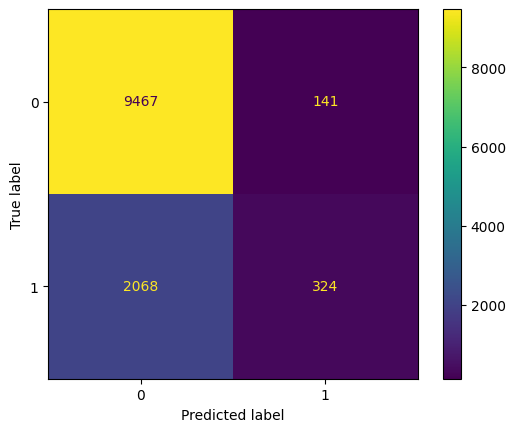

In [22]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,)
disp.plot()

plt.show()


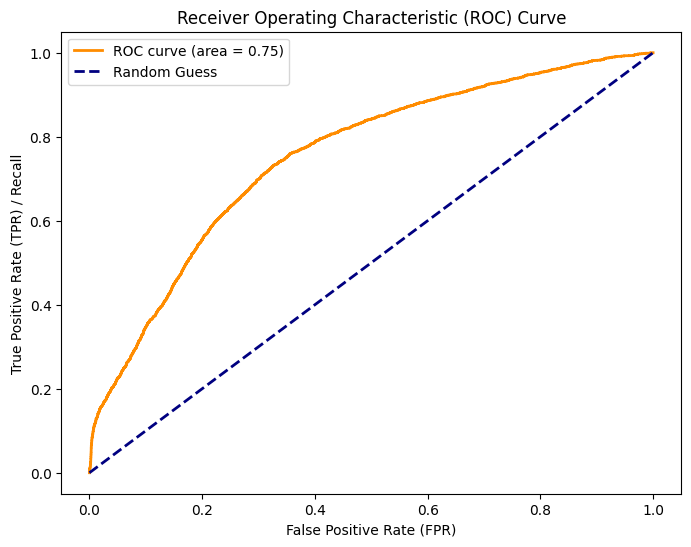

In [23]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt


try:
    # Try using decision_function
    y_pred_prob = model.decision_function(X_test_scaled)
except AttributeError:
    # If decision_function is not available, use predict_proba
    y_pred_prob = model.predict_proba(X_test_scaled)[:, 1]

# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR) / Recall')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


### XGBoost I

In [15]:
%pip install xgboost

from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score
import xgboost as xgb

params = {
    'objective': 'binary:logistic',  # for binary classification problems
}

num_rounds = 100

# Creating an isolation forest model
model = xgb.XGBClassifier(params=params, num_boost_round=num_rounds)

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Precision - correctness of when you predict anomaly
# Recall - correctness of how much anonmalies you pick up on
# F1 - the ratio between precison and recall

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred) # since we focus on anomalies F1 focuses more on the correctness of predicting 1 than  accuracy. Accuracy focuses too much on the success of predicting 0 non-anomaly (which we are not that interested in). F1 considers the trade off between precision and recall

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))



[notice] A new release of pip available: 22.3.1 -> 23.3.2
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
Accuracy: 0.9703333333333334
F1 Score: 0.923931623931624
Precision: 0.9449300699300699
Recall: 0.9038461538461539
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98      9608
           1       0.94      0.90      0.92      2392

    accuracy                           0.97     12000
   macro avg       0.96      0.95      0.95     12000
weighted avg       0.97      0.97      0.97     12000

Confusion Matrix:
 [[9482  126]
 [ 230 2162]]


/home/russellsb/.asdf/installs/python/3.10.10/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [19:36:10] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "num_boost_round", "params" } are not used.

  warnings.warn(smsg, UserWarning)


### Random Forest I

In [16]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier

# Creating a random forest model
model = RandomForestClassifier()

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred)

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))


Accuracy: 0.9571666666666667
F1 Score: 0.8863837312113174
Precision: 0.9404315196998124
Recall: 0.8382107023411371
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.97      9608
           1       0.94      0.84      0.89      2392

    accuracy                           0.96     12000
   macro avg       0.95      0.91      0.93     12000
weighted avg       0.96      0.96      0.96     12000

Confusion Matrix:
 [[9481  127]
 [ 387 2005]]


### Support Vector Classifier I

In [17]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.svm import LinearSVC

# Creating a random forest model
model = LinearSVC()

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred)

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))


Accuracy: 0.8153333333333334
F1 Score: 0.17925925925925926
Precision: 0.7857142857142857
Recall: 0.10117056856187291
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.99      0.90      9608
           1       0.79      0.10      0.18      2392

    accuracy                           0.82     12000
   macro avg       0.80      0.55      0.54     12000
weighted avg       0.81      0.82      0.75     12000

Confusion Matrix:
 [[9542   66]
 [2150  242]]


/home/russellsb/.asdf/installs/python/3.10.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [30]:
# Install tabulate if not already installed
%pip install -U tabulate

from tabulate import tabulate

# Results for Logistic Regression I
logistic_regression_results_1 = ['Logistic Regression I', 0.2, 40000, 0.8159, 0.6968, 0.1355, 0.2268]

# Results for XG Boost I (Replaced Isolation Forest I)
xg_boost_results_1 = ['XG Boost I', 0.2, 40000, 0.8153, 0.7857, 0.1012, 0.1793]

# Results for Random Forest I
random_forest_results_1 = ['Random Forest I', 0.2, 40000, 0.9573, 0.9392, 0.8399, 0.8868]

# Results for SVM I
svm_results_1 = ['SVM I', 0.2, 40000, 0.8153, 0.7857, 0.1012, 0.1793]

# List of results
results_list_1 = [logistic_regression_results_1, xg_boost_results_1, random_forest_results_1, svm_results_1]

# Table headers
headers = ['Model', 'Desired Proportion', 'Total Samples', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

# Print the table
print(tabulate(results_list_1, headers=headers, tablefmt='fancy_grid'))



[notice] A new release of pip available: 22.3.1 -> 23.3.2
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
╒═══════════════════════╤══════════════════════╤═════════════════╤════════════╤═════════════╤══════════╤════════════╕
│ Model                 │   Desired Proportion │   Total Samples │   Accuracy │   Precision │   Recall │   F1 Score │
╞═══════════════════════╪══════════════════════╪═════════════════╪════════════╪═════════════╪══════════╪════════════╡
│ Logistic Regression I │                  0.2 │           40000 │     0.8159 │      0.6968 │   0.1355 │     0.2268 │
├───────────────────────┼──────────────────────┼─────────────────┼────────────┼─────────────┼──────────┼────────────┤
│ XG Boost I            │                  0.2 │           40000 │     0.8153 │      0.7857 │   0.1012 │     0.1793 │
├───────────────────────┼──────────────────────┼─────────────────┼────────────┼─────────────┼──────────┼───────────

### 5.3 Under Sampling II


In [22]:
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Split the dataset into features (X) and target variable (y)
X = df[features]
y = df[target]

# Calculate the desired number of fraud cases based on the desired proportion
desired_proportion_2 = 0.2
total_samples_2 = 100000
fraud_samples = int(total_samples_2 * desired_proportion_2)

# Ensure that fraud_samples is less than or equal to the original number of fraud cases
fraud_samples = min(fraud_samples, y.sum())

# Create RandomUnderSampler with the desired sampling strategy
rus = RandomUnderSampler(sampling_strategy={0: total_samples_2 - fraud_samples, 1: fraud_samples}, random_state=1613)

# Apply random undersampling to the original dataset
X_resampled, y_resampled = rus.fit_resample(X, y)

# Split the resampled data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=1613)

# Standardize the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


### Logistic Regression II

In [19]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score

# Creating a logistic regression model
model = LogisticRegression()

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Precision - correctness of when you predict anomaly
# Recall - correctness of how much anonmalies you pick up on
# F1 - the ratio between Precision and Recall

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred) # since we focus on anomalies F1 focuses more on the correctness of predicting 1 than  accuracy. Accuracy focuses too much on the success of predicting 0 non-anomaly (which we are not that interested in). F1 considers the trade off between precision and recall

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))



Accuracy: 0.8133666666666667
F1 Score: 0.22030357888873417
Precision: 0.6720475785896347
Recall: 0.13174550299800133
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.98      0.89     23996
           1       0.67      0.13      0.22      6004

    accuracy                           0.81     30000
   macro avg       0.75      0.56      0.56     30000
weighted avg       0.79      0.81      0.76     30000

Confusion Matrix:
 [[23610   386]
 [ 5213   791]]


### XG Boost II

In [9]:
%pip install xgboost

from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score
import xgboost as xgb

params = {
    'objective': 'binary:logistic',  # for binary classification problems
}

num_rounds = 100

# Creating an isolation forest model
model = xgb.XGBClassifier(params=params, num_boost_round=num_rounds)

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Precision - correctness of when you predict anomaly
# Recall - correctness of how much anonmalies you pick up on
# F1 - the ratio between precison and recall

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred) # since we focus on anomalies F1 focuses more on the correctness of predicting 1 than  accuracy. Accuracy focuses too much on the success of predicting 0 non-anomaly (which we are not that interested in). F1 considers the trade off between precision and recall

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))



[notice] A new release of pip available: 22.3.1 -> 23.3.2
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


/home/russellsb/.asdf/installs/python/3.10.10/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [12:31:24] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "num_boost_round", "params" } are not used.

  warnings.warn(smsg, UserWarning)


Accuracy: 0.9713666666666667
F1 Score: 0.926612558735583
Precision: 0.9512366251534818
Recall: 0.9032311792138574
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98     23996
           1       0.95      0.90      0.93      6004

    accuracy                           0.97     30000
   macro avg       0.96      0.95      0.95     30000
weighted avg       0.97      0.97      0.97     30000

Confusion Matrix:
 [[23718   278]
 [  581  5423]]


### Random Forest II

In [23]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier

# Creating a random forest model
model = RandomForestClassifier()

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred)

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))


Accuracy: 0.9614666666666667
F1 Score: 0.8983468167428771
Precision: 0.9515648286140089
Recall: 0.8507661558960693
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.98     23996
           1       0.95      0.85      0.90      6004

    accuracy                           0.96     30000
   macro avg       0.96      0.92      0.94     30000
weighted avg       0.96      0.96      0.96     30000

Confusion Matrix:
 [[23736   260]
 [  896  5108]]


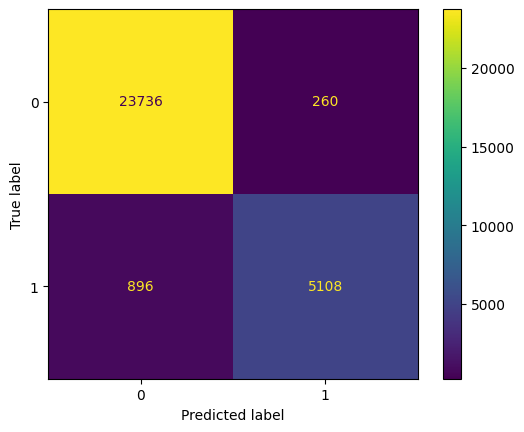

In [24]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,)
disp.plot()

plt.show()

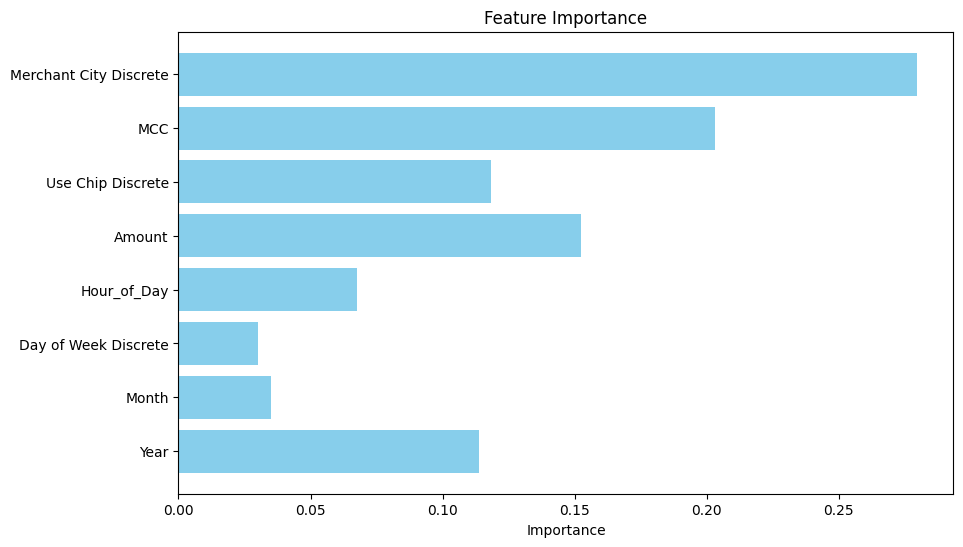

In [25]:
# Get feature importances from the trained random forest model
feature_importance = model.feature_importances_

# Plotting the feature importance
plt.figure(figsize=(10, 6))
plt.barh(features, feature_importance, color='skyblue')
plt.xlabel('Importance')
plt.title('Feature Importance')
plt.show()

0 0


/home/russellsb/.asdf/installs/python/3.10.10/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


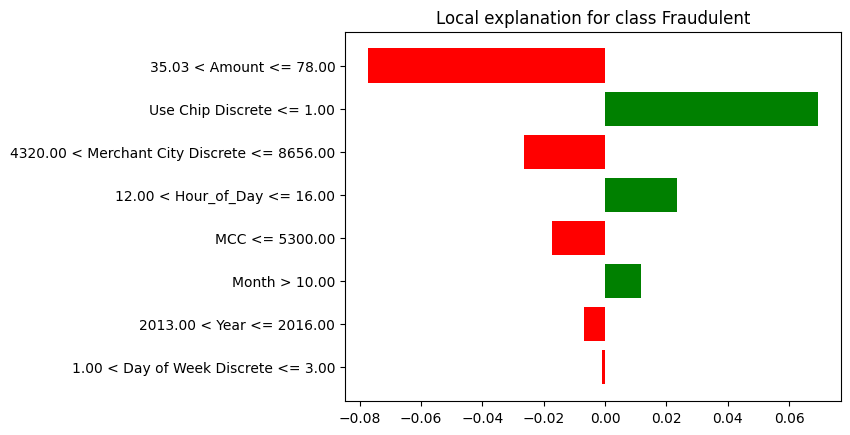

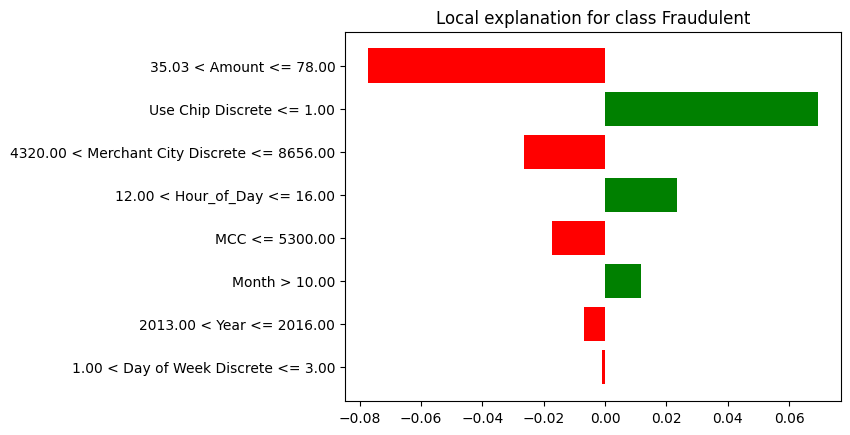

In [37]:
import lime
from lime import lime_tabular
from sklearn.pipeline import make_pipeline

c = make_pipeline(scaler, model)

def predict_batch(samples):
    return c.predict_proba(samples)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='classification', feature_names=X_train.columns, class_names=['Normal', 'Fraudulent'])

index_to_explain = 0  # Choose an index from the test set
instance_to_explain = X_test.values[index_to_explain]

print(y_test.values[index_to_explain], y_pred[index_to_explain]) # True negative! This is correctly normal

explanation = explainer.explain_instance(instance_to_explain, predict_batch, num_features=len(X_train.columns))
explanation.show_in_notebook(show_table=True, show_all=False)
explanation.as_pyplot_figure()

In [55]:
unique_merchant_city[]

'Chip Transaction'

1 0


/home/russellsb/.asdf/installs/python/3.10.10/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


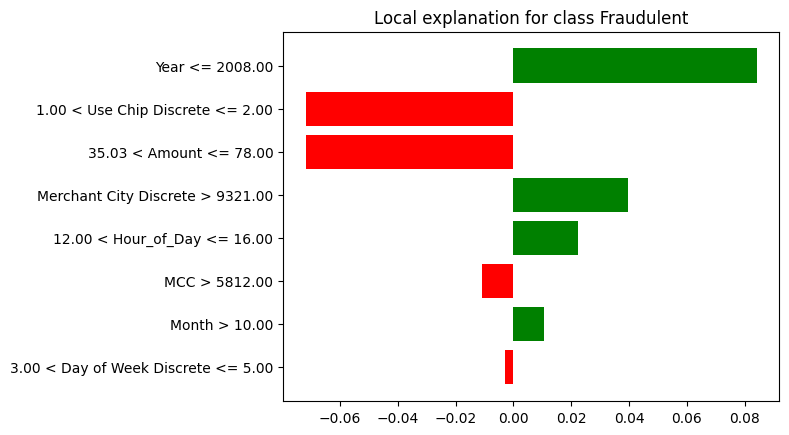

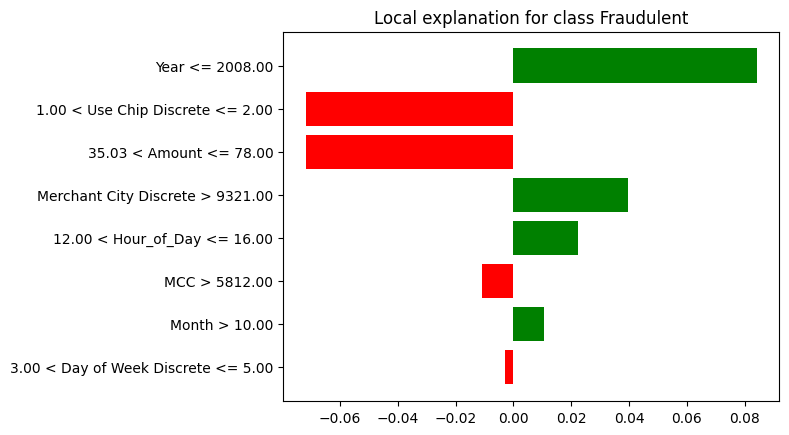

In [38]:
index_to_explain = 3  # Choose an index from the test set
instance_to_explain = X_test.values[index_to_explain]

print(y_test.values[index_to_explain], y_pred[index_to_explain]) # False negative. This is incorrently normal (missed fraudulent)

explanation = explainer.explain_instance(instance_to_explain, predict_batch, num_features=len(X_train.columns))
explanation.show_in_notebook(show_table=True, show_all=False)
explanation.as_pyplot_figure()

In [54]:
unique_use_chip[2]

'Swipe Transaction'

In [39]:
unique_day_of_week[5]

'Saturday'

In [40]:
for x in unique_merchant_city:
    print(x)

Aaronsburg
Abbeville
Abbot
Abbotsford
Abbott
Abbottstown
Aberdeen
Aberdeen Proving Ground
Abernathy
Abilene
Abingdon
Abington
Abiquiu
Abita Springs
Abrams
Absarokee
Absecon
Abu Dhabi
Abuja
Acampo
Acapulco
Accident
Accokeek
Accomac
Accord
Accoville
Accra
Ackerly
Ackerman
Ackley
Ackworth
Acme
Acra
Acton
Acushnet
Acworth
Ada
Adah
Adair
Adairsville
Adairville
Adams
Adams Center
Adams Run
Adamsburg
Adamstown
Adamsville
Addis
Addis Ababa
Addison
Addy
Adel
Adelanto
Adell
Adena
Adger
Adkins
Adrian
Advance
Afton
Agawam
Agency
Agoura Hills
Agra
Agua Dulce
Aguanga
Aguila
Aguilar
Ahoskie
Ahwahnee
Aiea
Aiken
Ailey
Ainsworth
Airville
Airway Heights
Aitkin
Ajo
Akron
Alabaster
Alachua
Alameda
Alamo
Alamogordo
Alamosa
Alanson
Alapaha
Alba
Albany
Albemarle
Albers
Albert Lea
Alberta
Alberton
Albertson
Albertville
Albia
Albion
Albright
Albrightsville
Albuquerque
Alburgh
Alburnett
Alburtis
Alcalde
Alcester
Alcoa
Alcolu
Alda
Alden
Alderson
Aldie
Aldrich
Aledo
Alex
Alexander
Alexander City
Alexandria
Alexand

In [41]:
unique_day_of_week[3]

'Thursday'

1 1


/home/russellsb/.asdf/installs/python/3.10.10/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


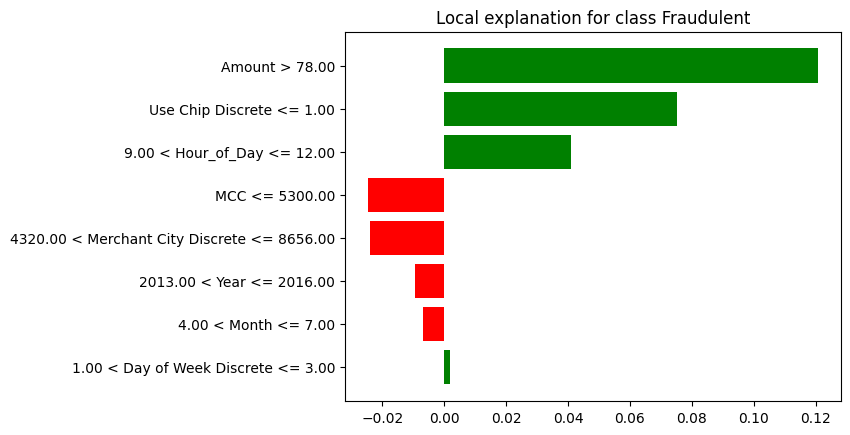

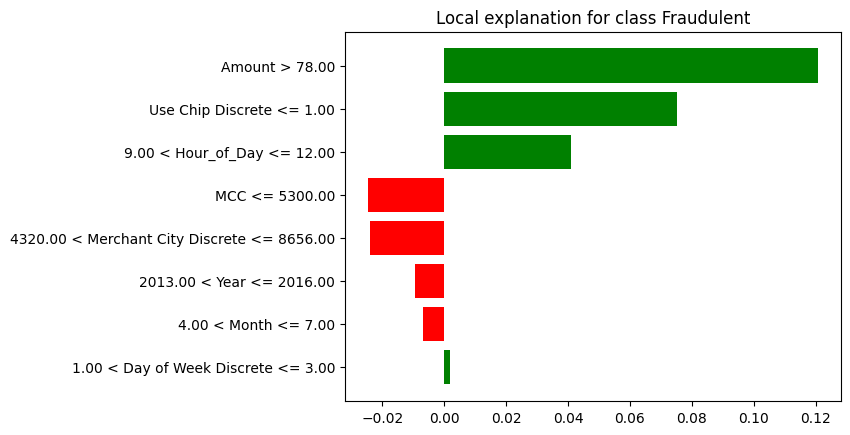

In [42]:
index_to_explain = 112  # Choose an index from the test set
instance_to_explain = X_test.values[index_to_explain]

print(y_test.values[index_to_explain], y_pred[index_to_explain]) # True negative. Correctly fraudulent

explanation = explainer.explain_instance(instance_to_explain, predict_batch, num_features=len(X_train.columns))
explanation.show_in_notebook(show_table=True, show_all=False)
explanation.as_pyplot_figure()

### Support Vector Classifier II

In [23]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.svm import LinearSVC

# Creating a random forest model
model = LinearSVC()

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred)

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))


Accuracy: 0.8132666666666667
F1 Score: 0.17593409826419537
Precision: 0.7531486146095718
Recall: 0.09960026648900733
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.99      0.89     23996
           1       0.75      0.10      0.18      6004

    accuracy                           0.81     30000
   macro avg       0.78      0.55      0.54     30000
weighted avg       0.80      0.81      0.75     30000

Confusion Matrix:
 [[23800   196]
 [ 5406   598]]


/home/russellsb/.asdf/installs/python/3.10.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [31]:
# Install tabulate if not already installed
%pip install -U tabulate

from tabulate import tabulate

# Results for Logistic Regression II
logistic_regression_results_2 = ['Logistic Regression II', 0.2, 100000, 0.8134, 0.6720, 0.1317, 0.2203]

# Results for XG Boost II (Replaced Isolation Forest II)
xg_boost_results_2 = ['XG Boost II', 0.2, 100000, 0.9714, 0.9512, 0.9032, 0.9266]

# Results for Random Forest II
random_forest_results_2 = ['Random Forest II', 0.2, 100000, 0.9618, 0.9532, 0.8508, 0.8991]

# Results for SVM II
svm_results_2 = ['SVM II', 0.2, 100000, 0.8133, 0.7531, 0.0996, 0.1759]

# List of results
results_list_2 = [logistic_regression_results_2, xg_boost_results_2, random_forest_results_2, svm_results_2]

# Table headers
headers = ['Model', 'Desired Proportion', 'Total Samples', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

# Print the table
print(tabulate(results_list_2, headers=headers, tablefmt='fancy_grid'))



[notice] A new release of pip available: 22.3.1 -> 23.3.2
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
╒════════════════════════╤══════════════════════╤═════════════════╤════════════╤═════════════╤══════════╤════════════╕
│ Model                  │   Desired Proportion │   Total Samples │   Accuracy │   Precision │   Recall │   F1 Score │
╞════════════════════════╪══════════════════════╪═════════════════╪════════════╪═════════════╪══════════╪════════════╡
│ Logistic Regression II │                  0.2 │          100000 │     0.8134 │      0.672  │   0.1317 │     0.2203 │
├────────────────────────┼──────────────────────┼─────────────────┼────────────┼─────────────┼──────────┼────────────┤
│ XG Boost II            │                  0.2 │          100000 │     0.9714 │      0.9512 │   0.9032 │     0.9266 │
├────────────────────────┼──────────────────────┼─────────────────┼────────────┼─────────────┼──────────┼────

## 5.3 Under Sampling III

In [43]:
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Split the dataset into features (X) and target variable (y)
X = df[features]
y = df[target]

# Calculate the desired number of fraud cases based on the desired proportion
desired_proportion_3 = 0.4
total_samples_3 = 200000
fraud_samples = int(total_samples_3 * desired_proportion_3)

# Ensure that fraud_samples is less than or equal to the original number of fraud cases
fraud_samples = min(fraud_samples, y.sum())

# Create RandomUnderSampler with the desired sampling strategy
rus = RandomUnderSampler(sampling_strategy={0: total_samples_3 - fraud_samples, 1: fraud_samples}, random_state=1613)

# Apply random undersampling to the original dataset
X_resampled, y_resampled = rus.fit_resample(X, y)

# Split the resampled data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=1613)

# Standardize the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


### Logistic Regression III

In [26]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score

# Creating a logistic regression model
model = LogisticRegression()

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Precision - correctness of when you predict anomaly
# Recall - correctness of how much anonmalies you pick up on
# F1 - the ratio between Precision and Recall

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred) # since we focus on anomalies F1 focuses more on the correctness of predicting 1 than  accuracy. Accuracy focuses too much on the success of predicting 0 non-anomaly (which we are not that interested in). F1 considers the trade off between precision and recall

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))



Accuracy: 0.86
F1 Score: 0.16334661354581675
Precision: 0.6737880032867708
Recall: 0.0929389096679134
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.99      0.92     51177
           1       0.67      0.09      0.16      8823

    accuracy                           0.86     60000
   macro avg       0.77      0.54      0.54     60000
weighted avg       0.84      0.86      0.81     60000

Confusion Matrix:
 [[50780   397]
 [ 8003   820]]


### Random Forest III

In [56]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier

# Creating a random forest model
model = RandomForestClassifier()

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred)

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))


Accuracy: 0.9704666666666667
F1 Score: 0.893739505876709
Precision: 0.9489367120845537
Recall: 0.8446106766405984
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98     51177
           1       0.95      0.84      0.89      8823

    accuracy                           0.97     60000
   macro avg       0.96      0.92      0.94     60000
weighted avg       0.97      0.97      0.97     60000

Confusion Matrix:
 [[50776   401]
 [ 1371  7452]]


### XG Boost III

In [44]:
%pip install xgboost

from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score
import xgboost as xgb

params = {
    'objective': 'binary:logistic',  # for binary classification problems
}

num_rounds = 100

# Creating an isolation forest model
model = xgb.XGBClassifier(params=params, num_boost_round=num_rounds)

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Precision - correctness of when you predict anomaly
# Recall - correctness of how much anonmalies you pick up on
# F1 - the ratio between precison and recall

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred) # since we focus on anomalies F1 focuses more on the correctness of predicting 1 than  accuracy. Accuracy focuses too much on the success of predicting 0 non-anomaly (which we are not that interested in). F1 considers the trade off between precision and recall

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))


1098.29s - pydevd: Sending message related to process being replaced timed-out after 5 seconds



[notice] A new release of pip available: 22.3.1 -> 23.3.2
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


/home/russellsb/.asdf/installs/python/3.10.10/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [12:27:18] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "num_boost_round", "params" } are not used.

  warnings.warn(smsg, UserWarning)


Accuracy: 0.9766666666666667
F1 Score: 0.9187086284984322
Precision: 0.9418978449815454
Recall: 0.8966337980278817
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99     51177
           1       0.94      0.90      0.92      8823

    accuracy                           0.98     60000
   macro avg       0.96      0.94      0.95     60000
weighted avg       0.98      0.98      0.98     60000

Confusion Matrix:
 [[50689   488]
 [  912  7911]]


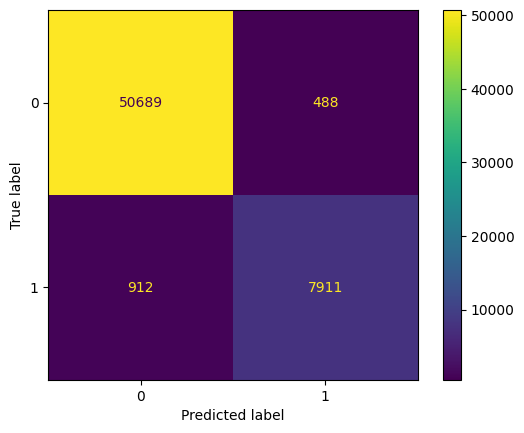

In [45]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,)
disp.plot()

plt.show()

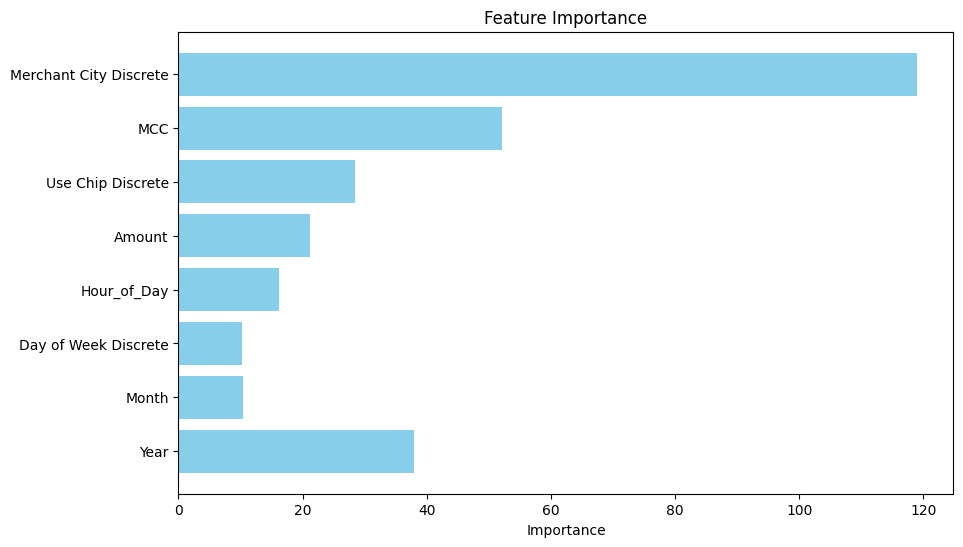

In [46]:
feature_importance = model.get_booster().get_score(importance_type='gain') # https://stackoverflow.com/questions/37627923/how-to-get-feature-importance-in-xgboost
# Your features string list

# Create a new dictionary with updated keys
feature_importance = {features[int(key[1:])]: value for key, value in feature_importance.items()}

# Plotting the feature importance
plt.figure(figsize=(10, 6))
plt.barh(list(feature_importance.keys()), list(feature_importance.values()), color='skyblue')
plt.xlabel('Importance')
plt.title('Feature Importance')
plt.show()

1 1


/home/russellsb/.asdf/installs/python/3.10.10/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


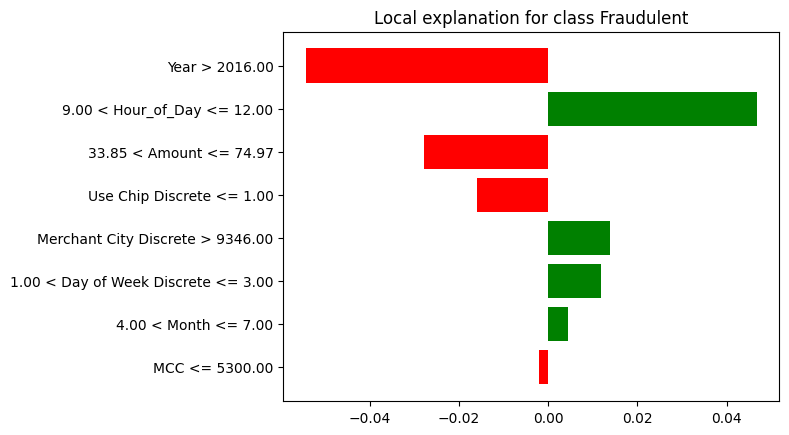

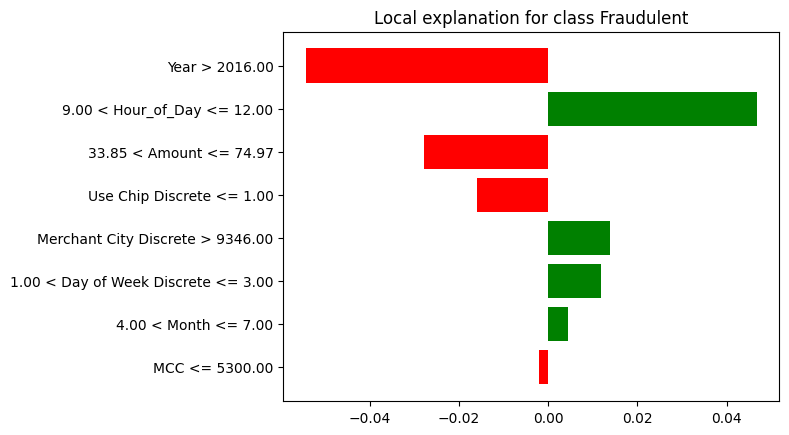

In [47]:
import lime
from lime import lime_tabular
from sklearn.pipeline import make_pipeline

c = make_pipeline(scaler, model)

def predict_batch(samples):
    return c.predict_proba(samples)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='classification', feature_names=X_train.columns, class_names=['Normal', 'Fraudulent'])

index_to_explain = 0  # Choose an index from the test set
instance_to_explain = X_test.values[index_to_explain]

print(y_test.values[index_to_explain], y_pred[index_to_explain]) # True positive. Correctly predicted anomaly

explanation = explainer.explain_instance(instance_to_explain, predict_batch, num_features=len(X_train.columns))
explanation.show_in_notebook(show_table=True, show_all=False)
explanation.as_pyplot_figure()

0 0


/home/russellsb/.asdf/installs/python/3.10.10/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


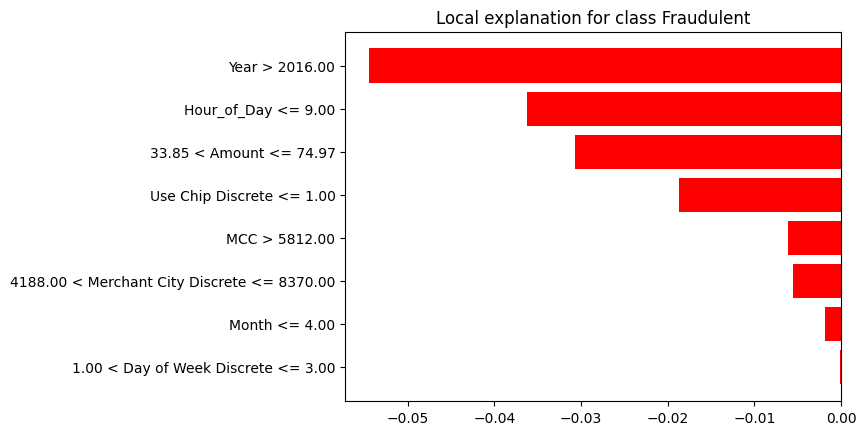

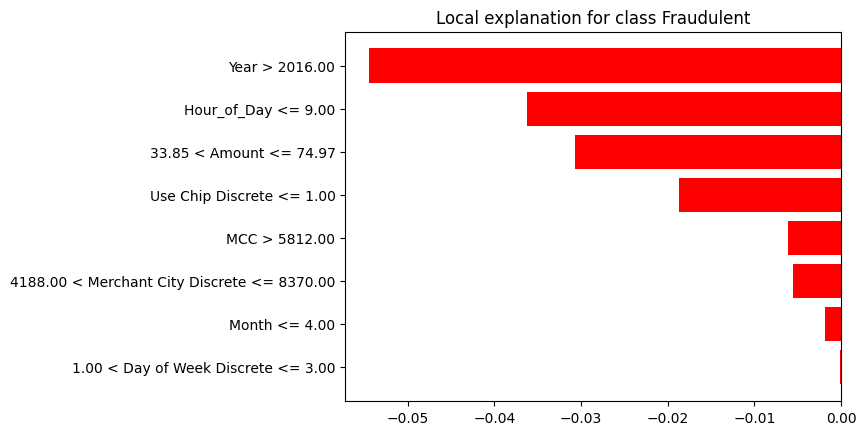

In [48]:
index_to_explain = 1  # Choose an index from the test set
instance_to_explain = X_test.values[index_to_explain]

print(y_test.values[index_to_explain], y_pred[index_to_explain]) # True negative. Correctly predicted anomaly

explanation = explainer.explain_instance(instance_to_explain, predict_batch, num_features=len(X_train.columns))
explanation.show_in_notebook(show_table=True, show_all=False)
explanation.as_pyplot_figure()

In [49]:
unique_merchant_city[9347:]

array(['Philip', 'Philippi', 'Philipsburg', ..., 'Zurich', 'Zwingle',
       'Zwolle'], dtype='<U26')

In [50]:
unique_use_chip[1]

'Online Transaction'

In [51]:
unique_use_chip[1]

'Online Transaction'

In [52]:
y_pred

array([1, 0, 1, ..., 0, 1, 0])

In [145]:
y_test

16818622    1
23748100    0
20148012    1
19430910    0
3597700     0
           ..
6824731     1
2056902     0
23006339    0
1011646     0
4939172     0
Name: Is Fraud?, Length: 60000, dtype: int64

### Support Vector Classifier III

In [38]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.svm import LinearSVC

# Creating a random forest model
model = LinearSVC()

# Training the model on the training data
model.fit(X_train_scaled, y_train)

# Making predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluating the model
metric_accuracy = accuracy_score(y_test, y_pred) 
metric_precision = precision_score(y_test, y_pred) 
metric_recall = recall_score(y_test, y_pred) 
metric_f1_score = f1_score(y_test, y_pred)

print(f'Accuracy: {metric_accuracy}')
print(f'F1 Score: {metric_f1_score}')
print(f'Precision: {metric_precision}')
print(f'Recall: {metric_recall}')

# Printing classification report and confusion matrix
print('Classification Report:\n', classification_report(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))


Accuracy: 0.8579666666666667
F1 Score: 0.10913652519339327
Precision: 0.702557200538358
Recall: 0.059163549812988776
Classification Report:
               precision    recall  f1-score   support

           0       0.86      1.00      0.92     51177
           1       0.70      0.06      0.11      8823

    accuracy                           0.86     60000
   macro avg       0.78      0.53      0.52     60000
weighted avg       0.84      0.86      0.80     60000

Confusion Matrix:
 [[50956   221]
 [ 8301   522]]


/home/russellsb/.asdf/installs/python/3.10.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [32]:
# Installing tabulate if not already installed
%pip install -U tabulate

from tabulate import tabulate

# Results for Logistic Regression III
logistic_regression_results_3 = ['Logistic Regression III', 0.4, 200000, 0.86, 0.6738, 0.0929, 0.1633]

# Results for XG Boost III
xg_boost_results_3 = ['XG Boost III', 0.4, 200000, 0.9769, 0.9429, 0.89697, 0.9194]

# Results for Random Forest III
random_forest_results_3 = ['Random Forest III', 0.4, 200000, 0.9711, 0.9509, 0.8472, 0.8961]

# Results for SVM III
svm_results_3 = ['SVM III', 0.4, 200000, 0.8579, 0.7026, 0.0592, 0.1091]

# List of results
results_list_3 = [logistic_regression_results_3, xg_boost_results_3, random_forest_results_3, svm_results_3]

# Table headers
headers = ['Model', 'Desired Proportion', 'Total Samples', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

# Printing the table
print(tabulate(results_list_3, headers=headers, tablefmt='fancy_grid'))



[notice] A new release of pip available: 22.3.1 -> 23.3.2
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
╒═════════════════════════╤══════════════════════╤═════════════════╤════════════╤═════════════╤══════════╤════════════╕
│ Model                   │   Desired Proportion │   Total Samples │   Accuracy │   Precision │   Recall │   F1 Score │
╞═════════════════════════╪══════════════════════╪═════════════════╪════════════╪═════════════╪══════════╪════════════╡
│ Logistic Regression III │                  0.4 │          200000 │     0.86   │      0.6738 │  0.0929  │     0.1633 │
├─────────────────────────┼──────────────────────┼─────────────────┼────────────┼─────────────┼──────────┼────────────┤
│ XG Boost III            │                  0.4 │          200000 │     0.9769 │      0.9429 │  0.89697 │     0.9194 │
├─────────────────────────┼──────────────────────┼─────────────────┼────────────┼─────────────┼────────

## ML Model results in a Tabular Format

In [34]:
# Installing tabulate if not already installed
%pip install -U tabulate

from tabulate import tabulate

# Results for Logistic Regression I
logistic_regression_results_1 = ['Logistic Regression I', 0.2, 40000, 0.8159, 0.6968, 0.1355, 0.2268]

# Results for XG Boost I
xg_boost_results_1 = ['XG Boost I', 0.2, 40000, 0.8153, 0.7857, 0.1012, 0.1793]

# Results for Random Forest I
random_forest_results_1 = ['Random Forest I', 0.2, 40000, 0.9573, 0.9392, 0.8399, 0.8868]

# Results for SVM I
svm_results_1 = ['SVM I', 0.2, 40000, 0.8153, 0.7857, 0.1012, 0.1793]

# Results for Logistic Regression II
logistic_regression_results_2 = ['Logistic Regression II', 0.2, 100000, 0.8134, 0.672, 0.1317, 0.2203]

# Results for XG Boost II
xg_boost_results_2 = ['XG Boost II', 0.2, 100000, 0.8133, 0.7531, 0.0996, 0.1759]

# Results for Random Forest II
random_forest_results_2 = ['Random Forest II', 0.2, 100000, 0.9618, 0.9532, 0.8508, 0.8991]

# Results for SVM II
svm_results_2 = ['SVM II', 0.2, 100000, 0.8133, 0.7531, 0.0996, 0.1759]

# Results for Logistic Regression III
logistic_regression_results_3 = ['Logistic Regression III', 0.4, 200000, 0.86, 0.6738, 0.0929, 0.1633]

# Results for XG Boost III
xg_boost_results_3 = ['XG Boost III', 0.4, 200000, 0.9769, 0.9429, 0.89697, 0.9194]

# Results for Random Forest III
random_forest_results_3 = ['Random Forest III', 0.4, 200000, 0.9711, 0.9509, 0.8472, 0.8961]

# Results for SVM III
svm_results_3 = ['SVM III', 0.4, 200000, 0.8579, 0.7026, 0.0592, 0.1091]

# Listing of results for each scenario
results_list_1 = [logistic_regression_results_1, xg_boost_results_1, random_forest_results_1, svm_results_1]
results_list_2 = [logistic_regression_results_2, xg_boost_results_2, random_forest_results_2, svm_results_2]
results_list_3 = [logistic_regression_results_3, xg_boost_results_3, random_forest_results_3, svm_results_3]

# Table headers
headers = ['Model', 'Desired Proportion', 'Total Samples', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

# Printing the tables
print("Under Sampling I:")
print(tabulate(results_list_1, headers=headers, tablefmt='fancy_grid'))

print("\nUnder Sampling II:")
print(tabulate(results_list_2, headers=headers, tablefmt='fancy_grid'))

print("\nUnder Sampling III:")
print(tabulate(results_list_3, headers=headers, tablefmt='fancy_grid'))


# Installing tabulate and termcolor if not already installed
%pip install -U tabulate termcolor

from tabulate import tabulate
from termcolor import colored

# ... (rest of your code)

# Custom function to add color to the table cells
def colorize_table(results_list, headers):
    colored_table = []

    for row in results_list:
        colored_row = [colored(cell, 'cyan', attrs=['bold']) if isinstance(cell, str) else colored(cell, 'yellow') for cell in row]
        colored_table.append(colored_row)

    return tabulate(colored_table, headers, tablefmt='pretty')

# Printing the colorized tables
print("Under Sampling I:")
print(colorize_table(results_list_1, headers))

print("\nUnder Sampling II:")
print(colorize_table(results_list_2, headers))

print("\nUnder Sampling III:")
print(colorize_table(results_list_3, headers))




[notice] A new release of pip available: 22.3.1 -> 23.3.2
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
Under Sampling I:
╒═══════════════════════╤══════════════════════╤═════════════════╤════════════╤═════════════╤══════════╤════════════╕
│ Model                 │   Desired Proportion │   Total Samples │   Accuracy │   Precision │   Recall │   F1 Score │
╞═══════════════════════╪══════════════════════╪═════════════════╪════════════╪═════════════╪══════════╪════════════╡
│ Logistic Regression I │                  0.2 │           40000 │     0.8159 │      0.6968 │   0.1355 │     0.2268 │
├───────────────────────┼──────────────────────┼─────────────────┼────────────┼─────────────┼──────────┼────────────┤
│ XG Boost I            │                  0.2 │           40000 │     0.8153 │      0.7857 │   0.1012 │     0.1793 │
├───────────────────────┼──────────────────────┼─────────────────┼────────────┼─────────────┼────